In [22]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [23]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision.datasets import ImageFolder
from torchvision import transforms
import timm

import matplotlib.pyplot as plt
import pandas as pd
import numpy as np


In [24]:
class PlayingcardDataset(Dataset):
    def __init__(self, file_path, transform=None):
        self.data = ImageFolder(file_path, transform=transform)

    def __len__ (self):
        return len(self.data)

    def __getitem__(self, index):
        return self.data[index]

    @property
    def classes(self):
        return self.data.classes


In [25]:
dataset = PlayingcardDataset(
    file_path=r"/content/drive/MyDrive/Py_Torch_Practices/dataset/train"
)

In [26]:
len(dataset)

7624

34


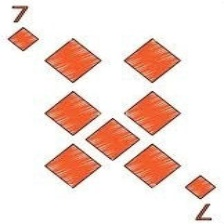

In [27]:
image, label = dataset[5000]
print(label)
image


In [28]:
# Get a dictionary associating target values with folder names
file_path=r"/content/drive/MyDrive/Py_Torch_Practices/dataset/train"
target_to_class = {v: k for k, v in ImageFolder(file_path).class_to_idx.items()}
print(target_to_class)

{0: 'ace of clubs', 1: 'ace of diamonds', 2: 'ace of hearts', 3: 'ace of spades', 4: 'eight of clubs', 5: 'eight of diamonds', 6: 'eight of hearts', 7: 'eight of spades', 8: 'five of clubs', 9: 'five of diamonds', 10: 'five of hearts', 11: 'five of spades', 12: 'four of clubs', 13: 'four of diamonds', 14: 'four of hearts', 15: 'four of spades', 16: 'jack of clubs', 17: 'jack of diamonds', 18: 'jack of hearts', 19: 'jack of spades', 20: 'joker', 21: 'king of clubs', 22: 'king of diamonds', 23: 'king of hearts', 24: 'king of spades', 25: 'nine of clubs', 26: 'nine of diamonds', 27: 'nine of hearts', 28: 'nine of spades', 29: 'queen of clubs', 30: 'queen of diamonds', 31: 'queen of hearts', 32: 'queen of spades', 33: 'seven of clubs', 34: 'seven of diamonds', 35: 'seven of hearts', 36: 'seven of spades', 37: 'six of clubs', 38: 'six of diamonds', 39: 'six of hearts', 40: 'six of spades', 41: 'ten of clubs', 42: 'ten of diamonds', 43: 'ten of hearts', 44: 'ten of spades', 45: 'three of clu

In [29]:
transforms = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

file_path=r"/content/drive/MyDrive/Py_Torch_Practices/dataset/train"
dataset = PlayingcardDataset(file_path, transforms)

In [30]:
image, label = dataset[1000]
image.shape

torch.Size([3, 128, 128])

In [31]:
for image, label in dataset:
  break

**Dataloaders**


*   Baching our dataset
*   Its more efficient and faster to train in batches



In [32]:
dataloader = DataLoader(dataset, batch_size=32, shuffle=True)

In [33]:
for images, label in dataloader:
  break

In [34]:
image.shape, label.shape

(torch.Size([3, 128, 128]), torch.Size([32]))

In [35]:
label

tensor([41, 14, 39,  1, 40, 28, 44, 38,  4, 46, 27,  3, 23, 48, 34, 10,  5, 52,
         0, 52, 34,  3, 23,  0, 32, 48, 15, 51, 19, 51, 27, 21])

***Modeling***


Pytorch datasets have a structured way of organizing your data, pytorch models follow a similar paradigm.
- We could create the model from scratch defining each layer.
- However for tasks like image classification, many of the state of the art architectures are readily available and we can import them from packages like timm.
- Understanding the pytorch model is all about understanding the shape the data is at each layer, and the main one we need to modify for a task is the final layer. Here we have 53 targets, so we will modify the last layer for this.


In [36]:
class SimpleCardClassifier(nn.Module):
  def __init__(self, num_classes=53):
    super(SimpleCardClassifier, self).__init__()
    self.base_model = timm.create_model('efficientnet_b0', pretrained=True)
    # Convert children to a list before slicing
    children_list = list(self.base_model.children())
    self.features = nn.Sequential(*children_list[:-1])

    #Make a classifier:
    enet_out_size = 1280
    self.classifier = nn.Sequential(
        nn.Flatten(),
        nn.Linear(enet_out_size, num_classes),
    )
  def forward(self, x):
    x = self.features(x)
    output = self.classifier(x)
    return output

In [37]:
model = SimpleCardClassifier(num_classes=53)
print(str(model)[:500])

SimpleCardClassifier(
  (base_model): EfficientNet(
    (conv_stem): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn1): BatchNormAct2d(
      32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True
      (drop): Identity()
      (act): SiLU(inplace=True)
    )
    (blocks): Sequential(
      (0): Sequential(
        (0): DepthwiseSeparableConv(
          (conv_dw): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=Fa


# The training loop

- Now that we understand the general paradigm of pytorch datasets and models, we need to create the process of training this model.
- Some things to consider: We want to validate our model on data it has not been trained on, so usually we split our data into a train and validate datasets (I have whole videos on this). This is easy because we can just create two datasets using our existing class.
    - Terms:
        - Epoch: One run through the entire training dataset.
        - Step: One batch of data as defined in our dataloader
- This loop is one you will become familiar with when training models, you load in data to the model in batches - then calculate the loss and perform backpropagation. There are packages that package this for you, but it's good to have at least written it once to understand how it works.
- Two things to select:
    - optimizer, `adam` is the best place to start for most tasks.
    - loss function: What the model will optimize for.


## Setup Datasets

In [39]:

from torchvision import transforms

transform = transforms.Compose([
transforms.Resize((128, 128)),
transforms.RandomHorizontalFlip(),
transforms.ToTensor(),
transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])

train_folder=r"/content/drive/MyDrive/Py_Torch_Practices/dataset/train"
test_folder=r"/content/drive/MyDrive/Py_Torch_Practices/dataset/test"
valid_folder=r"/content/drive/MyDrive/Py_Torch_Practices/dataset/valid"

train_dataset = PlayingcardDataset(train_folder, transform=transform)
val_dataset = PlayingcardDataset(valid_folder, transform=transform)
test_dataset = PlayingcardDataset(test_folder, transform=transform)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)





In [40]:
class EarlyStopping():
  def __init__(self, patience=7, min_delta = 1e-5, path="best_model.pt"):
    self.patience = patience
    self.min_delta = min_delta
    self.path = path

    self.best_loss = float("inf")
    self.counter = 0
    self.early_stop = False

  def __call__(self, val_loss, model):
    if val_loss < self.best_loss - self.min_delta:
      self.best_loss = val_loss
      self.counter = 0
      torch.save(model.state_dict(), self.path)
    else:
      self.counter += 1

      if self.counter > self.patience:
        self.early_stop = True


In [43]:
ealy_stopper = EarlyStopping(patience=7)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = SimpleCardClassifier(num_classes=53).to(device)
optimizer = optim.Adam(model.parameters(), lr=0.001)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=3)
criterion = nn.CrossEntropyLoss()

In [49]:
from tqdm import tqdm

epochs = 100
train_losses, val_losses = [], []
correct = 0
running_loss = 0.0

for epoch in range (epochs):
  model.train()
  running_loss = 0.0
  correct = 0
  for image, label in tqdm(train_loader, desc= 'Training loop'):
    image, label = image.to(device), label.to(device)
    optimizer.zero_grad()
    output = model(image)
    loss = criterion(output, label)
    loss.backward()
    optimizer.step()

    running_loss += loss.item() * image.size(0)
    _, preds = torch.max(output, 1)
    correct += torch.sum(preds == label)


  train_loss = running_loss/ len(train_loader.dataset)
  train_losses.append(train_loss)

  print(f"Epoch: {epoch+1}/{epochs}, Training Loss: {train_loss:.4f} |"
        f"Training Accuracy: {100 * correct / len(train_loader.dataset):.2f}%")


  model.eval()
  val_loss = 0.0
  correct_val = 0
  with torch.no_grad():
    for image, label in tqdm(val_loader, desc= 'Evaluating loop' ):
      image, label = image.to(device), label.to(device)
      output = model(image)
      loss = criterion(output, label)
      val_loss += loss.item() * image.size(0)
      _, preds = torch.max(output, 1)
      correct_val += torch.sum(preds == label)

    scheduler.step(val_loss)
    val_loss = val_loss/ len(val_loader.dataset)
    val_losses.append(val_loss)
    print(f"Epoch: {epoch+1}/{epochs}, Validation Loss: {val_loss:.4f} |"
          f"Validation Accuracy: {100 * correct_val / len(val_loader.dataset):.2f}%")

    #Early stopping:
    ealy_stopper(val_loss, model)
    if ealy_stopper.early_stop:
      print("Early stopping")
      break

model.load_state_dict(torch.load(ealy_stopper.path, map_location=device))
print("Training complete, best model loaded.")

Training loop: 100%|██████████| 239/239 [00:41<00:00,  5.77it/s]


Epoch: 1/100, Training Loss: 0.6016 |Training Accuracy: 82.28%


Evaluating loop: 100%|██████████| 9/9 [01:29<00:00,  9.91s/it]


Epoch: 1/100, Validation Loss: 0.3106 |Validation Accuracy: 91.70%


Training loop: 100%|██████████| 239/239 [00:40<00:00,  5.83it/s]


Epoch: 2/100, Training Loss: 0.4011 |Training Accuracy: 88.34%


Evaluating loop: 100%|██████████| 9/9 [00:01<00:00,  8.76it/s]


Epoch: 2/100, Validation Loss: 0.1582 |Validation Accuracy: 94.34%


Training loop: 100%|██████████| 239/239 [00:40<00:00,  5.92it/s]


Epoch: 3/100, Training Loss: 0.3179 |Training Accuracy: 90.44%


Evaluating loop: 100%|██████████| 9/9 [00:01<00:00,  8.83it/s]


Epoch: 3/100, Validation Loss: 0.1938 |Validation Accuracy: 95.09%


Training loop: 100%|██████████| 239/239 [00:40<00:00,  5.87it/s]


Epoch: 4/100, Training Loss: 0.2475 |Training Accuracy: 92.20%


Evaluating loop: 100%|██████████| 9/9 [00:00<00:00,  9.10it/s]


Epoch: 4/100, Validation Loss: 0.1644 |Validation Accuracy: 95.09%


Training loop: 100%|██████████| 239/239 [00:40<00:00,  5.92it/s]


Epoch: 5/100, Training Loss: 0.1866 |Training Accuracy: 94.57%


Evaluating loop: 100%|██████████| 9/9 [00:01<00:00,  8.66it/s]


Epoch: 5/100, Validation Loss: 0.1881 |Validation Accuracy: 93.58%


Training loop: 100%|██████████| 239/239 [00:40<00:00,  5.88it/s]


Epoch: 6/100, Training Loss: 0.1855 |Training Accuracy: 94.40%


Evaluating loop: 100%|██████████| 9/9 [00:01<00:00,  8.82it/s]


Epoch: 6/100, Validation Loss: 0.1754 |Validation Accuracy: 96.60%


Training loop: 100%|██████████| 239/239 [00:40<00:00,  5.95it/s]


Epoch: 7/100, Training Loss: 0.0946 |Training Accuracy: 97.19%


Evaluating loop: 100%|██████████| 9/9 [00:01<00:00,  8.83it/s]


Epoch: 7/100, Validation Loss: 0.0513 |Validation Accuracy: 98.11%


Training loop: 100%|██████████| 239/239 [00:40<00:00,  5.94it/s]


Epoch: 8/100, Training Loss: 0.0474 |Training Accuracy: 98.75%


Evaluating loop: 100%|██████████| 9/9 [00:01<00:00,  8.56it/s]


Epoch: 8/100, Validation Loss: 0.0586 |Validation Accuracy: 98.11%


Training loop: 100%|██████████| 239/239 [00:40<00:00,  5.92it/s]


Epoch: 9/100, Training Loss: 0.0350 |Training Accuracy: 98.95%


Evaluating loop: 100%|██████████| 9/9 [00:01<00:00,  8.96it/s]


Epoch: 9/100, Validation Loss: 0.0552 |Validation Accuracy: 98.11%


Training loop: 100%|██████████| 239/239 [00:40<00:00,  5.95it/s]


Epoch: 10/100, Training Loss: 0.0268 |Training Accuracy: 99.30%


Evaluating loop: 100%|██████████| 9/9 [00:01<00:00,  8.78it/s]


Epoch: 10/100, Validation Loss: 0.0673 |Validation Accuracy: 97.74%


Training loop: 100%|██████████| 239/239 [00:40<00:00,  5.94it/s]


Epoch: 11/100, Training Loss: 0.0248 |Training Accuracy: 99.34%


Evaluating loop: 100%|██████████| 9/9 [00:01<00:00,  8.72it/s]


Epoch: 11/100, Validation Loss: 0.0621 |Validation Accuracy: 98.49%


Training loop: 100%|██████████| 239/239 [00:40<00:00,  5.91it/s]


Epoch: 12/100, Training Loss: 0.0188 |Training Accuracy: 99.49%


Evaluating loop: 100%|██████████| 9/9 [00:01<00:00,  8.93it/s]


Epoch: 12/100, Validation Loss: 0.0528 |Validation Accuracy: 98.49%


Training loop: 100%|██████████| 239/239 [00:40<00:00,  5.85it/s]


Epoch: 13/100, Training Loss: 0.0170 |Training Accuracy: 99.55%


Evaluating loop: 100%|██████████| 9/9 [00:01<00:00,  8.58it/s]


Epoch: 13/100, Validation Loss: 0.0548 |Validation Accuracy: 98.11%


Training loop: 100%|██████████| 239/239 [00:41<00:00,  5.78it/s]


Epoch: 14/100, Training Loss: 0.0179 |Training Accuracy: 99.57%


Evaluating loop: 100%|██████████| 9/9 [00:01<00:00,  8.28it/s]


Epoch: 14/100, Validation Loss: 0.0675 |Validation Accuracy: 98.11%


Training loop: 100%|██████████| 239/239 [00:41<00:00,  5.81it/s]


Epoch: 15/100, Training Loss: 0.0169 |Training Accuracy: 99.61%


Evaluating loop: 100%|██████████| 9/9 [00:01<00:00,  8.64it/s]


Epoch: 15/100, Validation Loss: 0.0696 |Validation Accuracy: 98.49%
Early stopping
Training complete, best model loaded.


# Visualize Losses

We can plot our training and validation loss through this training, usually we do this at the end of each epoch. We see that our accuracy on the validation dataset is `x`! There are a LOT more things to learn about that can drastically improve how to train a model which I will cover in future videos, but this should give you a good start!



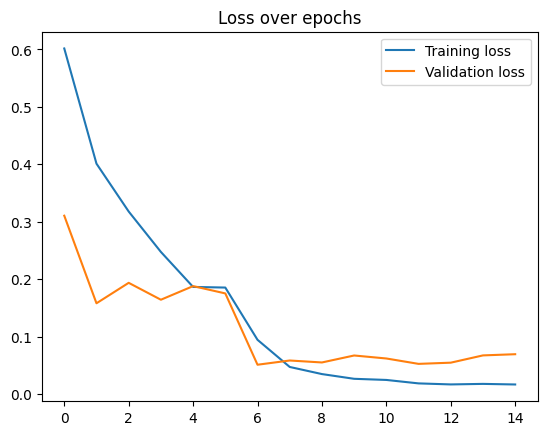

In [50]:
plt.plot(train_losses, label='Training loss')
plt.plot(val_losses, label='Validation loss')
plt.legend()
plt.title("Loss over epochs")
plt.show()

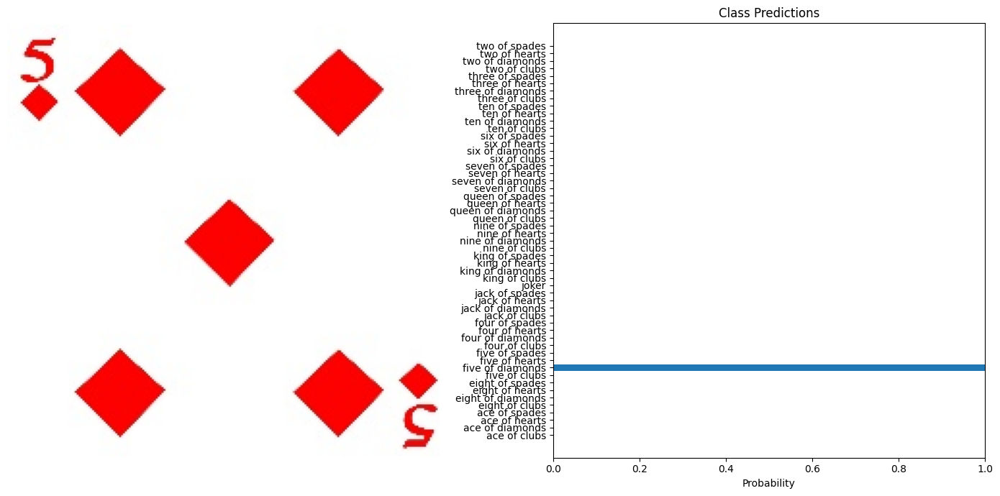

In [53]:
import torch
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

# Load and preprocess the image
def preprocess_image(image_path, transform):
    image = Image.open(image_path).convert("RGB")
    return image, transform(image).unsqueeze(0)

# Predict using the model
def predict(model, image_tensor, device):
    model.eval()
    with torch.no_grad():
        image_tensor = image_tensor.to(device)
        outputs = model(image_tensor)
        probabilities = torch.nn.functional.softmax(outputs, dim=1)
    return probabilities.cpu().numpy().flatten()

# Visualization
def visualize_predictions(original_image, probabilities, class_names):
    fig, axarr = plt.subplots(1, 2, figsize=(14, 7))

    # Display image
    axarr[0].imshow(original_image)
    axarr[0].axis("off")

    # Display predictions
    axarr[1].barh(class_names, probabilities)
    axarr[1].set_xlabel("Probability")
    axarr[1].set_title("Class Predictions")
    axarr[1].set_xlim(0, 1)

    plt.tight_layout()
    plt.show()

# Example usage
test_image = "/content/drive/MyDrive/Py_Torch_Practices/dataset/test/five of diamonds/2.jpg"
transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor()
])

original_image, image_tensor = preprocess_image(test_image, transform)
probabilities = predict(model, image_tensor, device)

# Assuming dataset.classes gives the class names
class_names = dataset.classes
visualize_predictions(original_image, probabilities, class_names)

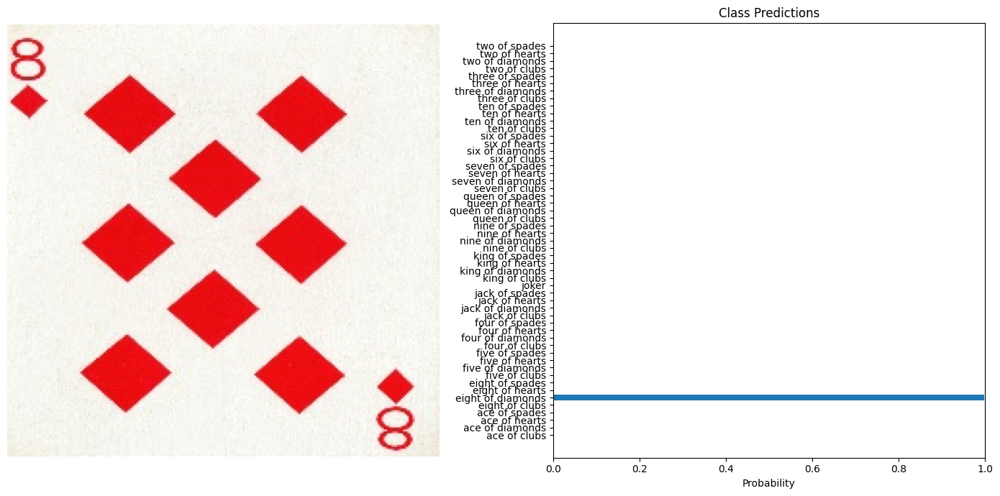

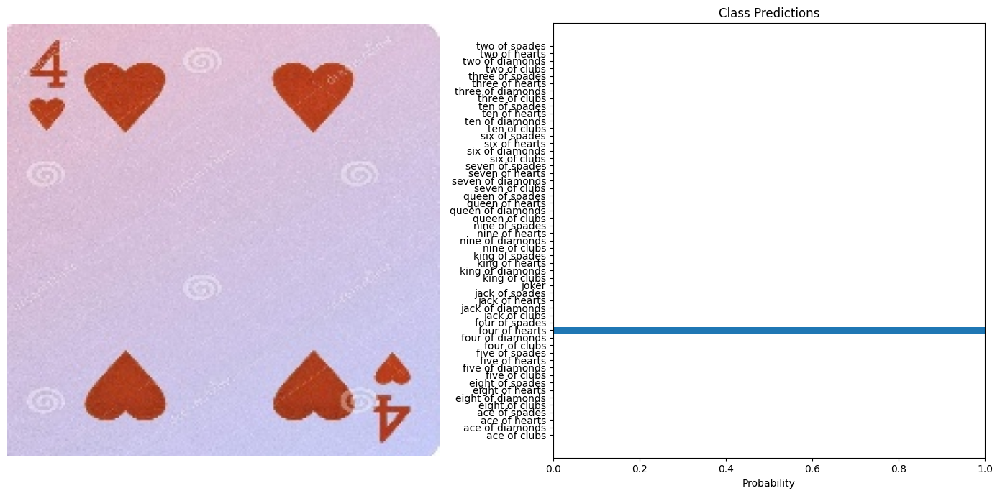

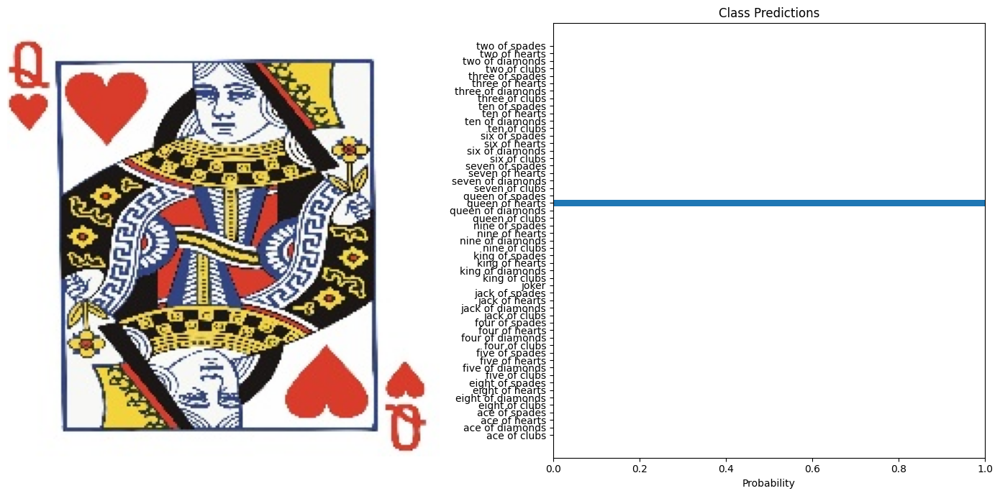

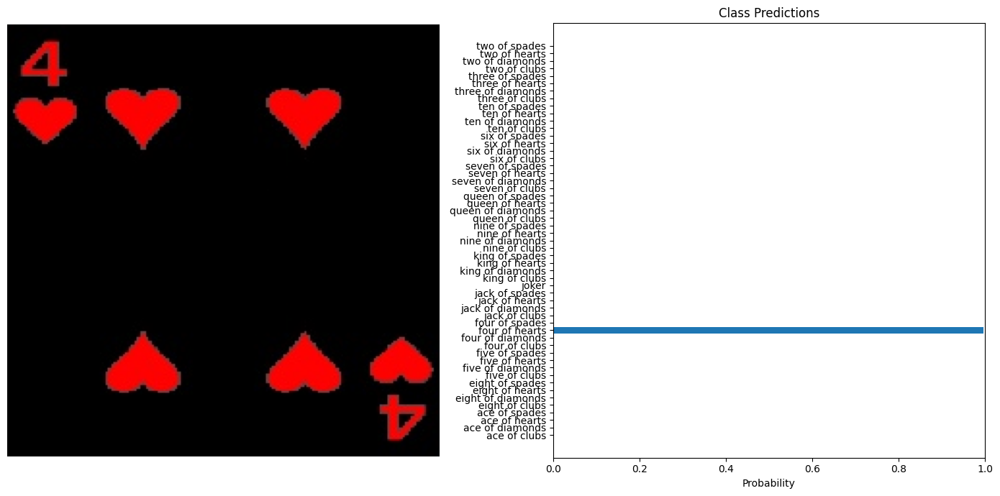

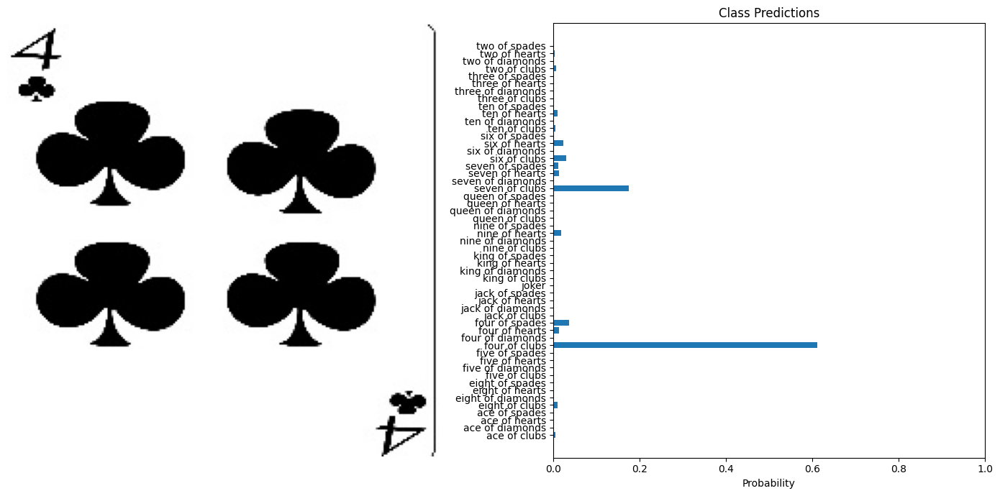

...

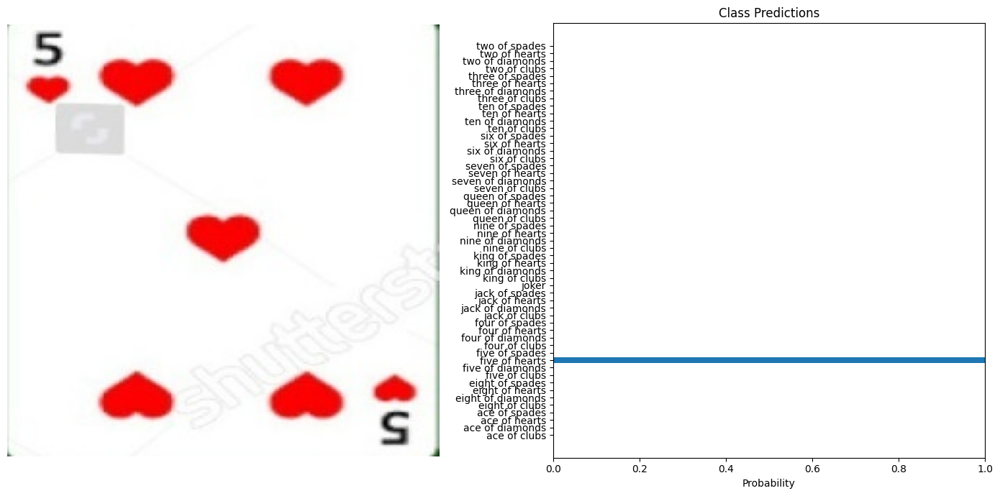

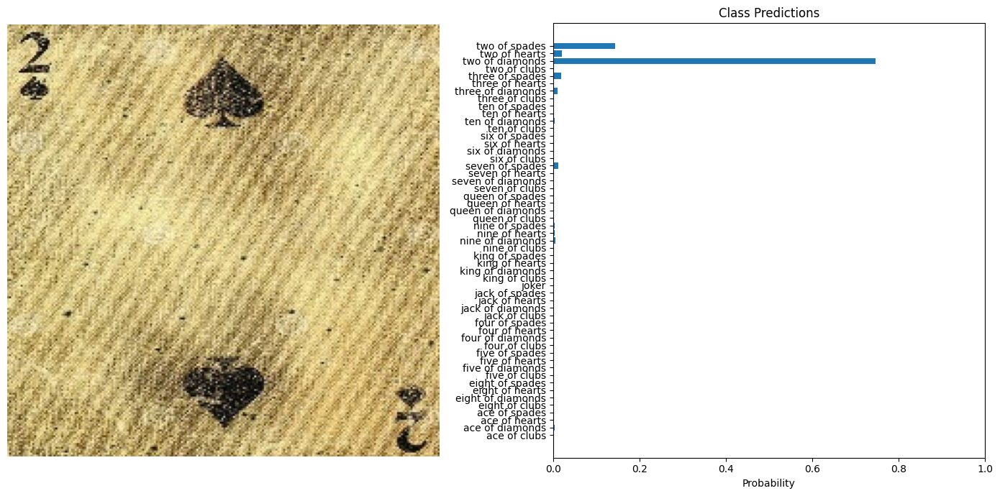

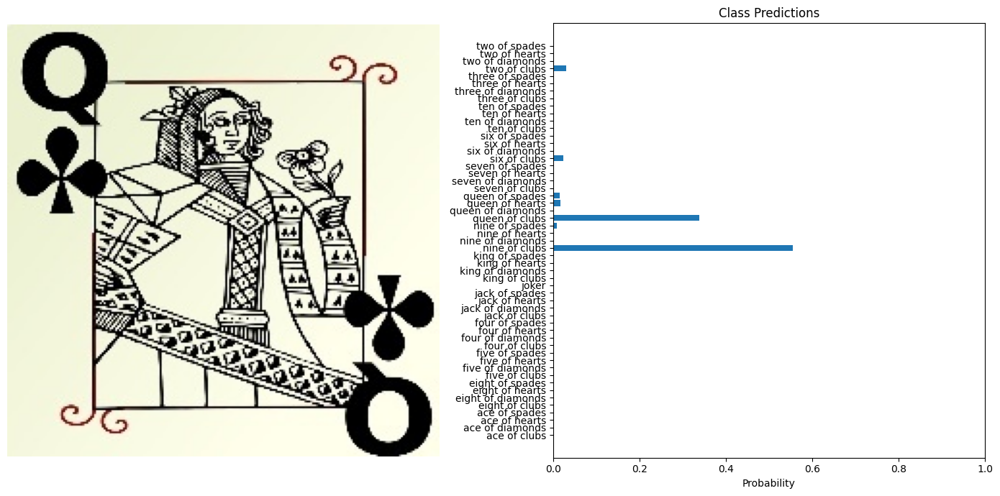

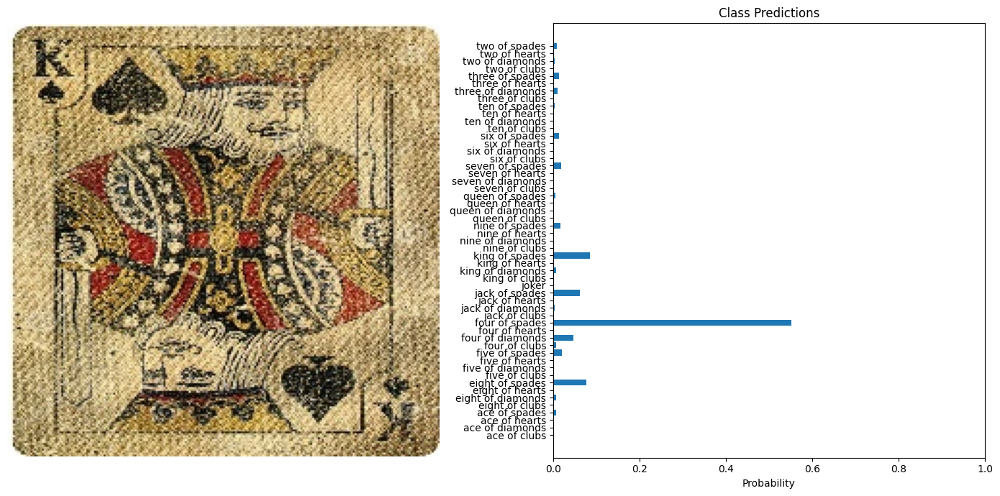

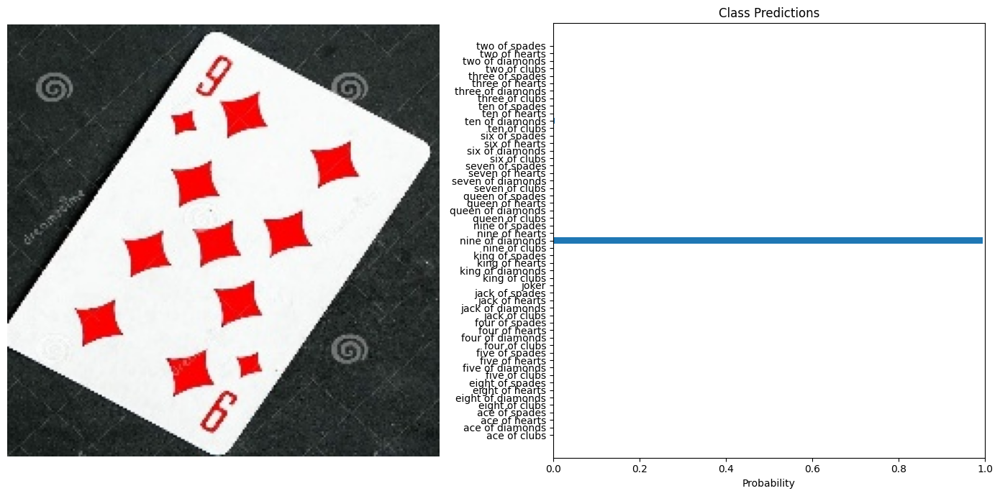

In [56]:
from glob import glob
test_images = glob('/content/drive/MyDrive/Py_Torch_Practices/dataset/test/*/*')
test_examples = np.random.choice(test_images, 20)

for example in test_examples:
    original_image, image_tensor = preprocess_image(example, transform)
    probabilities = predict(model, image_tensor, device)

    # Assuming dataset.classes gives the class names
    class_names = dataset.classes
    visualize_predictions(original_image, probabilities, class_names)